In [1]:
#Libraries needed - installed under Python 3.9.6. Also tested on Python 3.8
import pandas as pd
import scanpy

## Stage 1: Reading Data from Raw Files, Filtering for Adult Barcodes, End Result: 1891 Nuclei

In [2]:
df = pd.read_csv('htseq_ORN_nuclei_LogCPM_17plates_addintron_hq50k_neuron2-5.tab.gz',  sep="\t", header=0, index_col=0)

In [3]:
#these two below don't use anymore
df_ORN_24h = pd.read_csv('htseq_ORN_cell_LogCPM_10plates_hq50k_neuron2-5.tab.gz', sep="\t", header=0, index_col=0)

df_ORN_42h = pd.read_csv('htseq_logCPM_hq.tab.gz', sep="\t", header=0, index_col=0)

In [4]:
names_adult = []
with open ("names_ORN_hq_24h_adult_lamGFP_noAN.txt") as f:
    for line in f:
        names_adult.append(line.rstrip())

In [5]:
names_adult

['',
 'ORNnuclei_adult_nSybUNC84GFP_P6_F5',
 'ORNcell_24h_ElavCD8GFP_P4_A210',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A11',
 'ORNnuclei_adult_nSybUNC84GFP_P8_M19',
 'ORNcell_24h_ElavCD8GFP_P4_A208',
 'ORN_10day_nuclei_P3_N18',
 'ORNnuclei_adult_nSybUNC84GFP_P9_L14',
 'ORNcell_24h_ElavCD8GFP_P4_A100',
 'ORNcell_24h_ElavCD8GFP_P6_A181',
 'ORNcell_24h_ElavCD8GFP_P4_A87',
 'ORNcell_24h_ElavCD8GFP_P7_A257',
 'ORNnuclei_adult_nSybUNC84GFP_P2_C15',
 'ORNcell_24h_ElavCD8GFP_P7_A197',
 'ORNcell_24h_ElavCD8GFP_P3_E8',
 'ORNnuclei_adult_nSybUNC84GFP_P7_N20',
 'ORNcell_24h_ElavCD8GFP_P1_M2',
 'ORNnuclei_adult_nSybUNC84GFP_P10_E7',
 'ORNcell_24h_ElavCD8GFP_P6_A32',
 'ORNnuclei_adult_nSybUNC84GFP_P7_B1',
 'ORN_10day_nuclei_P3_E13',
 'ORNnuclei_adult_nSybUNC84GFP_P5_B24',
 'ORNnuclei_adult_nSybUNC84GFP_P7_K16',
 'ORNcell_24h_ElavCD8GFP_P5_A371',
 'ORNcell_24h_ElavCD8GFP_P3_L2',
 'ORNnuclei_adult_nSybUNC84GFP_P8_E23',
 'ORNnuclei_adult_nSybUNC84GFP_P8_F11',
 'ORNnuclei_adult_nSybUNC84GFP_P9_K4',
 'ORNcell_

In [6]:
df_reset = df.reset_index()
dff = df_reset.dropna()

In [7]:
dff

,symbol,ORNnuclei_24h_ElavUNC84GFP_P1_A10,ORNnuclei_24h_ElavUNC84GFP_P1_A11,ORNnuclei_24h_ElavUNC84GFP_P1_A12,ORNnuclei_24h_ElavUNC84GFP_P1_A14,ORNnuclei_24h_ElavUNC84GFP_P1_A15,ORNnuclei_24h_ElavUNC84GFP_P1_A16,ORNnuclei_24h_ElavUNC84GFP_P1_A17,ORNnuclei_24h_ElavUNC84GFP_P1_A18,ORNnuclei_24h_ElavUNC84GFP_P1_A19,...,ORNnuclei_adult_AM29UNC84GFP_P3_I6,ORNnuclei_adult_AM29UNC84GFP_P3_J4,ORNnuclei_adult_AM29UNC84GFP_P3_L14,ORNnuclei_adult_AM29UNC84GFP_P3_N15,ORNnuclei_adult_AM29UNC84GFP_P3_N8,ORNnuclei_adult_AM29UNC84GFP_P3_O1,ORNnuclei_adult_AM29UNC84GFP_P3_P2,ORNnuclei_adult_AM29UNC84GFP_P3_P6,ORNnuclei_adult_AM29UNC84GFP_P3_P7,ORNnuclei_adult_AM29UNC84GFP_P3_P9
0,7SLRNA:CR32864,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,2.686720,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
1,a,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
2,abd-A,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
3,Abd-B,0.00000,0.355199,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
4,Abl,0.00000,0.000000,8.842987,0.000000,8.639862,0.000000,0.000000,6.866842,9.823826,...,0.000000,0.0,0.000000,0.0,0.000000,10.899275,0.0,0.00000,0.0,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17467,Tlk,10.17826,0.000000,11.226340,12.193361,11.718939,8.438584,7.543272,9.081231,10.448562,...,7.990722,0.0,5.791417,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
17468,muc,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,14.929313,0.000000,0.0,8.56226,0.0,3.2962
17469,THG,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000
17470,Rap2l,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.00000,0.0,0.0000


In [8]:
adult_exps = list(pd.Series(dff.columns)[pd.Series(dff.columns).str.contains("adult")].values)

In [9]:
adult_exps

['ORNnuclei_adult_nSybUNC84GFP_P1_A10',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A13',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A16',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A17',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A18',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A19',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A2',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A3',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A4',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A5',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A6',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A7',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A8',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B10',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B13',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B22',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B2',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B5',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B7',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C12',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C14',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C16',
 'ORNnucle

In [10]:
terms = {}
for x in adult_exps:
    splits = x.split("_")[:-2]
    for y in splits:
        if y not in terms:
            terms[y] = 1
        else:
            terms[y] += 1

In [11]:
terms

{'ORNnuclei': 1715, 'adult': 1715, 'nSybUNC84GFP': 1690, 'AM29UNC84GFP': 25}

In [12]:
df_libs = pd.read_csv('PN_ORN_libs_CNM.csv', sep=",", header=0, index_col=0)
df_libs.head()

,pooled_library,SampleID,Index,num,experiment,plate,well,num_cells,num_mapped_reads,color,genotype,colorHL,label
library,,,,,,,,,,,,,
N447Barcode_701-502,N477,1000100701-A1-flybrain-1,TAAGGCGA-ATAGAGAG,2477.0,13.0,1000100701,A1,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
N447Barcode_702-502,N447,1000100701-A2-flybrain-1,CGTACTAG-ATAGAGAG,2478.0,13.0,1000100701,A2,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
N447Barcode_703-502,N447,1000100701-A3-flybrain-1,AGGCAGAA-ATAGAGAG,2479.0,13.0,1000100701,A3,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
N447Barcode_704-502,N447,1000100701-A4-flybrain-1,TCCTGAGC-ATAGAGAG,2480.0,13.0,1000100701,A4,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
N447Barcode_705-502,N447,1000100701-A5-flybrain-1,GGACTCCT-ATAGAGAG,2481.0,13.0,1000100701,A5,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0


In [13]:
df_libs_r = df_libs.reset_index()

In [14]:
df_libs_r

,library,pooled_library,SampleID,Index,num,experiment,plate,well,num_cells,num_mapped_reads,color,genotype,colorHL,label
0,N447Barcode_701-502,N477,1000100701-A1-flybrain-1,TAAGGCGA-ATAGAGAG,2477.0,13.0,1000100701,A1,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
1,N447Barcode_702-502,N447,1000100701-A2-flybrain-1,CGTACTAG-ATAGAGAG,2478.0,13.0,1000100701,A2,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
2,N447Barcode_703-502,N447,1000100701-A3-flybrain-1,AGGCAGAA-ATAGAGAG,2479.0,13.0,1000100701,A3,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
3,N447Barcode_704-502,N447,1000100701-A4-flybrain-1,TCCTGAGC-ATAGAGAG,2480.0,13.0,1000100701,A4,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
4,N447Barcode_705-502,N447,1000100701-A5-flybrain-1,GGACTCCT-ATAGAGAG,2481.0,13.0,1000100701,A5,1.0,NaN,#a3eb13,nSyb_48h_ORN,#e31a1c,nSyb_48h_ORN_P0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10073,ORN_10day_nuclei_P3_P5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#bc5bf5,ORNnuclei_adult_nSybLam_P3,ORNnuclei_adult_nSybLam,NaN
10074,ORN_10day_nuclei_P3_P6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#bc5bf5,ORNnuclei_adult_nSybLam_P3,ORNnuclei_adult_nSybLam,NaN
10075,ORN_10day_nuclei_P3_P7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#bc5bf5,ORNnuclei_adult_nSybLam_P3,ORNnuclei_adult_nSybLam,NaN
10076,ORN_10day_nuclei_P3_P8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#bc5bf5,ORNnuclei_adult_nSybLam_P3,ORNnuclei_adult_nSybLam,NaN


In [15]:
adult_genotypes = list(df_libs_r[df_libs_r["genotype"].str.contains('adult')]["genotype"].value_counts().index)

In [16]:
adult_genotypes

['ORNnuclei_adult_nSybUNC84GFP_P5',
 'ORNnuclei_adult_nSybUNC84GFP_P6',
 'ORNnuclei_adult_nSybUNC84GFP_P7',
 'ORNnuclei_adult_nSybUNC84GFP_P8',
 'ORNnuclei_adult_nSybUNC84GFP_P9',
 'ORNnuclei_adult_nSybUNC84GFP_P10',
 'ORNnuclei_adult_nSybUNC84GFP_P2',
 'ORNnuclei_adult_nSybUNC84GFP_P3',
 'ORNnuclei_adult_nSybUNC84GFP_P1',
 'ORNnuclei_adult_nSybLam_P3',
 'ORNnuclei_adult_nSybLam_P2']

In [17]:
adult_libraries = list(df_libs_r[df_libs_r["genotype"].isin(adult_genotypes)]["library"])

In [18]:
adult_libraries

['ORNnuclei_adult_nSybUNC84GFP_P5_A1',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A10',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A11',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A12',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A13',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A14',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A15',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A16',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A17',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A18',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A19',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A2',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A20',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A21',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A22',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A23',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A24',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A3',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A4',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A5',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A6',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A7',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A8',
 'ORNnuclei_adult_nSybUNC84GFP_P5_A9',
 'ORNnuclei_adult_nSybUNC84GFP_P5_B1',
 'ORNnucle

In [19]:
raw_cols = list(dff.columns[1:])

In [20]:
raw_cols

['ORNnuclei_24h_ElavUNC84GFP_P1_A10',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A11',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A12',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A14',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A15',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A16',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A17',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A18',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A19',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A22',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A23',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A2',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A3',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A4',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A6',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A8',
 'ORNnuclei_24h_ElavUNC84GFP_P1_A9',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B11',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B12',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B15',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B16',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B18',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B20',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B2',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B3',
 'ORNnuclei_24h_ElavUNC84GFP_P1_B6',
 'ORNnuclei_24h_ElavU

In [21]:
adult_orns = [] 
for x in raw_cols:
    if x in adult_libraries and x in names_adult:
        adult_orns.append(x)

In [22]:
adult_orns

['ORNnuclei_adult_nSybUNC84GFP_P1_A10',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A13',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A16',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A17',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A18',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A2',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A3',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A4',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A5',
 'ORNnuclei_adult_nSybUNC84GFP_P1_A6',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B10',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B22',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B2',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B5',
 'ORNnuclei_adult_nSybUNC84GFP_P1_B7',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C12',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C14',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C15',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C1',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C2',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C4',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C7',
 'ORNnuclei_adult_nSybUNC84GFP_P1_C9',
 'ORNnuclei_a

In [23]:
len(adult_orns)

1891

In [24]:
adult_matrix = df.loc[:, adult_orns]

In [25]:
adult_matrix

,ORNnuclei_adult_nSybUNC84GFP_P1_A10,ORNnuclei_adult_nSybUNC84GFP_P1_A13,ORNnuclei_adult_nSybUNC84GFP_P1_A15,ORNnuclei_adult_nSybUNC84GFP_P1_A16,ORNnuclei_adult_nSybUNC84GFP_P1_A17,ORNnuclei_adult_nSybUNC84GFP_P1_A18,ORNnuclei_adult_nSybUNC84GFP_P1_A2,ORNnuclei_adult_nSybUNC84GFP_P1_A3,ORNnuclei_adult_nSybUNC84GFP_P1_A4,ORNnuclei_adult_nSybUNC84GFP_P1_A5,...,ORN_10day_nuclei_P3_O22,ORN_10day_nuclei_P3_O2,ORN_10day_nuclei_P3_O3,ORN_10day_nuclei_P3_O5,ORN_10day_nuclei_P3_O6,ORN_10day_nuclei_P3_O9,ORN_10day_nuclei_P3_P12,ORN_10day_nuclei_P3_P6,ORN_10day_nuclei_P3_P8,ORN_10day_nuclei_P3_P9
symbol,,,,,,,,,,,,,,,,,,,,,
7SLRNA:CR32864,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000
a,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000
abd-A,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.664245,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000
Abd-B,0.942753,3.159498,0.000000,0.643068,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,1.052887,0.000000,0.000000,0.0,0.0,0.000000,0.00000
Abl,0.000000,0.000000,3.171619,1.086304,1.661904,0.0,0.000000,0.438997,0.664245,0.000000,...,9.066968,0.000000,0.0,6.009122,0.000000,0.000000,0.0,0.0,0.000000,8.44149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tlk,10.134722,0.000000,5.046242,9.309562,8.560695,0.0,11.677178,0.000000,0.664245,9.160247,...,7.058768,10.074278,0.0,10.200527,8.715140,9.234812,0.0,0.0,13.441499,0.00000
muc,10.939835,0.000000,0.000000,0.643068,0.000000,0.0,0.000000,0.000000,1.972213,0.000000,...,0.000000,7.255704,0.0,1.052887,0.000000,0.000000,0.0,0.0,0.000000,0.00000
THG,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.00000


In [26]:
adult_matrix.reset_index().to_csv("ya_edit_adult_orns_matrix.csv", index=None)

In [27]:
retransformed = pow(2, adult_matrix)-1
retransformed.reset_index().to_csv("ya_edit_adult_orns_matrix_retransformed.csv", index=None)

In [28]:
retransformed

,ORNnuclei_adult_nSybUNC84GFP_P1_A10,ORNnuclei_adult_nSybUNC84GFP_P1_A13,ORNnuclei_adult_nSybUNC84GFP_P1_A15,ORNnuclei_adult_nSybUNC84GFP_P1_A16,ORNnuclei_adult_nSybUNC84GFP_P1_A17,ORNnuclei_adult_nSybUNC84GFP_P1_A18,ORNnuclei_adult_nSybUNC84GFP_P1_A2,ORNnuclei_adult_nSybUNC84GFP_P1_A3,ORNnuclei_adult_nSybUNC84GFP_P1_A4,ORNnuclei_adult_nSybUNC84GFP_P1_A5,...,ORN_10day_nuclei_P3_O22,ORN_10day_nuclei_P3_O2,ORN_10day_nuclei_P3_O3,ORN_10day_nuclei_P3_O5,ORN_10day_nuclei_P3_O6,ORN_10day_nuclei_P3_O9,ORN_10day_nuclei_P3_P12,ORN_10day_nuclei_P3_P6,ORN_10day_nuclei_P3_P8,ORN_10day_nuclei_P3_P9
symbol,,,,,,,,,,,,,,,,,,,,,
7SLRNA:CR32864,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
a,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
abd-A,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.584739,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Abd-B,0.922193,7.935185,0.000000,0.561647,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,1.074677,0.000000,0.000000,0.0,0.0,0.000000,0.000000
Abl,0.000000,0.000000,8.010574,1.123294,2.164338,0.0,0.000000,0.355661,0.584739,0.000000,...,535.326615,0.000000,0.0,63.405953,0.000000,0.000000,0.0,0.0,0.000000,346.649454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tlk,1123.230773,0.000000,32.042296,633.537735,376.594847,0.0,3273.769394,0.000000,0.584739,571.148825,...,132.321758,1077.101916,0.0,1175.696821,419.260379,601.497924,0.0,0.0,11123.855519,0.000000
muc,1963.348371,0.000000,0.000000,0.561647,0.000000,0.0,0.000000,0.000000,2.923694,0.000000,...,0.000000,151.821518,0.0,1.074677,0.000000,0.000000,0.0,0.0,0.000000,0.000000
THG,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000


## Stage 2: Cluster Analysis

In [29]:
amtx = scanpy.read_csv("ya_edit_adult_orns_matrix_retransformed.csv")
amtx = amtx.T

In [30]:
amtx

AnnData object with n_obs × n_vars = 1891 × 17472

In [31]:
amtx.to_df()

,7SLRNA:CR32864,a,abd-A,Abd-B,Abl,abo,ac,Ace,acj6,Acph-1,...,CR46299,CR46300,elgi,CG46301,Rpp30,Tlk,muc,THG,Rap2l,mCD8-GFP
ORNnuclei_adult_nSybUNC84GFP_P1_A10,0.0,0.0,0.0,0.922193,0.000000,0.0,0.0,7.377542,1588.015869,0.0,...,0.0,0.0,0.000000,0.000000,0.0,1123.230713,1963.348389,0.0,0.0,0.0
ORNnuclei_adult_nSybUNC84GFP_P1_A13,0.0,0.0,0.0,7.935185,0.000000,0.0,0.0,216.895065,52.901237,0.0,...,0.0,0.0,0.000000,10.580247,0.0,0.000000,0.000000,0.0,0.0,0.0
ORNnuclei_adult_nSybUNC84GFP_P1_A15,0.0,0.0,0.0,0.000000,8.010574,0.0,0.0,0.000000,1642.167603,0.0,...,0.0,0.0,0.000000,16.021149,0.0,32.042297,0.000000,0.0,0.0,0.0
ORNnuclei_adult_nSybUNC84GFP_P1_A16,0.0,0.0,0.0,0.561647,1.123294,0.0,0.0,424.043427,2736.343750,0.0,...,0.0,0.0,32.013874,0.000000,0.0,633.537720,0.561647,0.0,0.0,0.0
ORNnuclei_adult_nSybUNC84GFP_P1_A17,0.0,0.0,0.0,0.000000,2.164338,0.0,0.0,2.164338,634.151062,0.0,...,0.0,0.0,0.000000,2.164338,0.0,376.594849,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ORN_10day_nuclei_P3_O9,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,5635.231934,30.490679,0.0,...,0.0,0.0,0.000000,0.000000,0.0,601.497925,0.000000,0.0,0.0,0.0
ORN_10day_nuclei_P3_P12,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,206.352722,44.218437,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
ORN_10day_nuclei_P3_P6,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,1650.279419,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
ORN_10day_nuclei_P3_P8,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.000000,0.0,11123.855469,0.000000,0.0,0.0,0.0


In [32]:
gene_names = pd.Series(list(amtx.to_df().columns))

In [33]:
gene_names

0        7SLRNA:CR32864
1                     a
2                 abd-A
3                 Abd-B
4                   Abl
              ...      
17467               Tlk
17468               muc
17469               THG
17470             Rap2l
17471          mCD8-GFP
Length: 17472, dtype: object

In [34]:
np = pd.read_csv("neuropeptide_full_info_merged.csv")
npr = pd.read_csv("neuropeptide_receptors_full_info_merged.csv")

In [35]:
np

,name,GeneName,fbid,gene_snapshot_text,summary
0,Akh,Adipokinetic hormone,FBgn0004552,Adipokinetic hormone (Akh) encodes a peptide h...,The gene Adipokinetic hormone is referred to i...
1,AstA,Allatostatin A,FBgn0015591,Contributions welcome.,The gene Allatostatin A is referred to in FlyB...
2,AstC,Allatostatin C,FBgn0032336,Allatostatin C (AstC) encodes a myotropic fact...,The gene Allatostatin C is referred to in FlyB...
3,AstCC,Allatostatin double C,FBgn0032337,Contributions welcome.,The gene Allatostatin double C is referred to ...
4,Burs,Bursicon,FBgn0038901,Bursicon (Burs) encodes a cystine knot protein...,The gene Bursicon is referred to in FlyBase by...
5,CCAP,Crustacean cardioactive peptide,FBgn0039007,Crustacean cardioactive peptide (CCAP) encodes...,The gene Crustacean cardioactive peptide is re...
6,CCHa1,CCHamide-1,FBgn0038199,Contributions welcome.,The gene CCHamide-1 is referred to in FlyBase ...
7,CCHa2,CCHamide-2,FBgn0038147,Contributions welcome.,The gene CCHamide-2 is referred to in FlyBase ...
8,CNMa,CNMamide,FBgn0035282,CNMamide (CNMa) encodes a short signaling pept...,The gene CNMamide is referred to in FlyBase by...
9,Capa,Capability,FBgn0039722,Capability (Capa) encodes three neuropeptides:...,The gene Capability is referred to in FlyBase ...


In [36]:
npr

,name,GeneName,fbid,gene_snapshot_text,summary
0,AkhR,Adipokinetic hormone receptor,FBgn0025595,Adipokinetic hormone receptor (AkhR) encodes a...,The gene Adipokinetic hormone receptor is refe...
1,AstA-R1,Allatostatin A receptor 1,FBgn0266429,Allatostatin A receptor 1 (AstA-R1) encodes a ...,The gene Allatostatin A receptor 1 is referred...
2,AstA-R2,Allatostatin A receptor 2,FBgn0039595,Allatostatin A receptor 2 (AstA-R2) encodes a ...,The gene Allatostatin A receptor 2 is referred...
3,AstC-R1,Allatostatin C receptor 1,FBgn0036790,Allatostatin C receptor 1 (AstC-R1) encodes G-...,The gene Allatostatin C receptor 1 is referred...
4,AstC-R2,Allatostatin C receptor 2,FBgn0036789,Allatostatin C receptor 2 (AstC-R2) encodes G-...,The gene Allatostatin C receptor 2 is referred...
5,CCAP-R,Crustacean cardioactive peptide receptor,FBgn0039396,Contributions welcome.,The gene Crustacean cardioactive peptide recep...
6,CCHa1-R,CCHamide-1 receptor,FBgn0050106,Contributions welcome.,The gene CCHamide-1 receptor is referred to in...
7,CCHa2-R,CCHamide-2 receptor,FBgn0033058,Contributions welcome.,The gene CCHamide-2 receptor is referred to in...
8,CCKLR-17D1,Cholecystokinin-like receptor at 17D1,FBgn0259231,Cholecystokinin-like receptor at 17D1 (CCKLR-1...,The gene Cholecystokinin-like receptor at 17D1...
9,CCKLR-17D3,Cholecystokinin-like receptor at 17D3,FBgn0030954,Cholecystokinin-like receptor at 17D3 (CCKLR-1...,The gene Cholecystokinin-like receptor at 17D3...


In [37]:
neuropeptides = list(np["name"])
neuropeptide_receptors = list(npr["name"])

In [39]:
neuropeptides

['Akh',
 'AstA',
 'AstC',
 'AstCC',
 'Burs',
 'CCAP',
 'CCHa1',
 'CCHa2',
 'CNMa',
 'Capa',
 'Crz',
 'Dh31',
 'Dh44',
 'Dsk',
 'ETH',
 'Eh',
 'FMRFa',
 'Gpa2',
 'Gpb5',
 'Hug',
 'ITP',
 'Ilp1',
 'Ilp2',
 'Ilp3',
 'Ilp4',
 'Ilp5',
 'Ilp6',
 'Ilp7',
 'Ilp8',
 'Lk',
 'Lst',
 'Mip',
 'Ms',
 'NPF',
 'Nplp1',
 'Nplp2',
 'Nplp3',
 'Nplp4',
 'Orcokinin',
 'Pburs',
 'Pdf',
 'Proc',
 'Ptth',
 'RYa',
 'SIFa',
 'SP',
 'Tk',
 'Trissin',
 'amn',
 'sNPF',
 'spab']

In [40]:
neuropeptide_receptors

['AkhR',
 'AstA-R1',
 'AstA-R2',
 'AstC-R1',
 'AstC-R2',
 'CCAP-R',
 'CCHa1-R',
 'CCHa2-R',
 'CCKLR-17D1',
 'CCKLR-17D3',
 'CNMaR',
 'CapaR',
 'CrzR',
 'Dh31-R',
 'Dh44-R1',
 'Dh44-R2',
 'ETHR',
 'FMRFaR',
 'Hr4',
 'InR',
 'Lgr1',
 'Lkr',
 'MsR1',
 'MsR2',
 'NPFR',
 'PK1-R',
 'PK2-R1',
 'PK2-R2',
 'Pdfr',
 'Proc-R',
 'RYa-R',
 'SIFaR',
 'SPR',
 'TkR86C',
 'TkR99D',
 'TrissinR',
 'rk',
 'sNPF-R']

In [49]:
set(neuropeptides).difference(set(list(gene_names[gene_names.isin(neuropeptides)])))

{'spab'}

In [56]:
set(neuropeptide_receptors).difference(set(list(gene_names[gene_names.isin(neuropeptide_receptors)])))

set()

In [71]:
spab = ['CG2816']

In [70]:
gene_names[(gene_names.str.contains('CG2816'))]

4305    CG2816
dtype: object

In [74]:
npall = list(gene_names[(gene_names.isin(neuropeptides)) | (gene_names.isin(neuropeptide_receptors)) | (gene_names.isin(spab))])

In [75]:
npall

['Dsk',
 'Eh',
 'FMRFa',
 'SP',
 'rk',
 'Akh',
 'TkR99D',
 'TkR86C',
 'RYa-R',
 'Ms',
 'Dh44',
 'Ptth',
 'Crz',
 'AstA',
 'Lgr1',
 'Pdf',
 'AkhR',
 'NPF',
 'Hug',
 'Lk',
 'ETH',
 'Proc-R',
 'SPR',
 'CCKLR-17D3',
 'CG2816',
 'Dh31',
 'AstC',
 'AstCC',
 'sNPF',
 'CCHa2-R',
 'Dh44-R2',
 'Dh44-R1',
 'Lst',
 'Orcokinin',
 'ITP',
 'Nplp1',
 'CNMa',
 'MsR1',
 'FMRFaR',
 'Lkr',
 'Ilp2',
 'CrzR',
 'Ilp8',
 'Mip',
 'AstC-R2',
 'AstC-R1',
 'sNPF-R',
 'CapaR',
 'NPFR',
 'Tk',
 'PK2-R2',
 'PK2-R1',
 'CCHa2',
 'CCHa1',
 'PK1-R',
 'Trissin',
 'ETHR',
 'SIFaR',
 'Burs',
 'CCAP',
 'CCAP-R',
 'AstA-R2',
 'Capa',
 'Nplp4',
 'Nplp2',
 'Nplp3',
 'Ilp7',
 'Ilp6',
 'Ilp5',
 'Ilp4',
 'Ilp3',
 'Ilp1',
 'Proc',
 'CCHa1-R',
 'Dh31-R',
 'SIFa',
 'CNMaR',
 'Gpb5',
 'TrissinR',
 'RYa',
 'amn',
 'CCKLR-17D1',
 'Pdfr',
 'Gpa2',
 'MsR2',
 'Hr4',
 'Pburs',
 'AstA-R1',
 'InR']

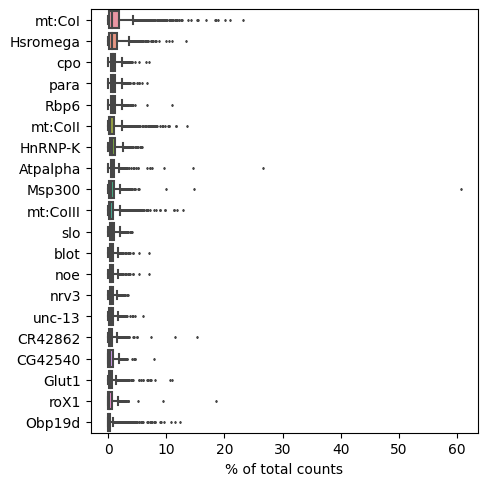

In [76]:
scanpy.pl.highest_expr_genes(amtx, n_top=20, )

In [77]:
scanpy.pp.calculate_qc_metrics(amtx, percent_top=None, log1p=False, inplace=True)

In [78]:
amtx

AnnData object with n_obs × n_vars = 1891 × 17472
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [79]:
amtx.obs

,n_genes_by_counts,total_counts
ORNnuclei_adult_nSybUNC84GFP_P1_A10,1029,1.000004e+06
ORNnuclei_adult_nSybUNC84GFP_P1_A13,1044,9.999996e+05
ORNnuclei_adult_nSybUNC84GFP_P1_A15,1086,9.999971e+05
ORNnuclei_adult_nSybUNC84GFP_P1_A16,2282,1.000003e+06
ORNnuclei_adult_nSybUNC84GFP_P1_A17,1133,1.000003e+06
...,...,...
ORN_10day_nuclei_P3_O9,394,9.999999e+05
ORN_10day_nuclei_P3_P12,482,1.000000e+06
ORN_10day_nuclei_P3_P6,950,9.999987e+05
ORN_10day_nuclei_P3_P8,353,9.999996e+05


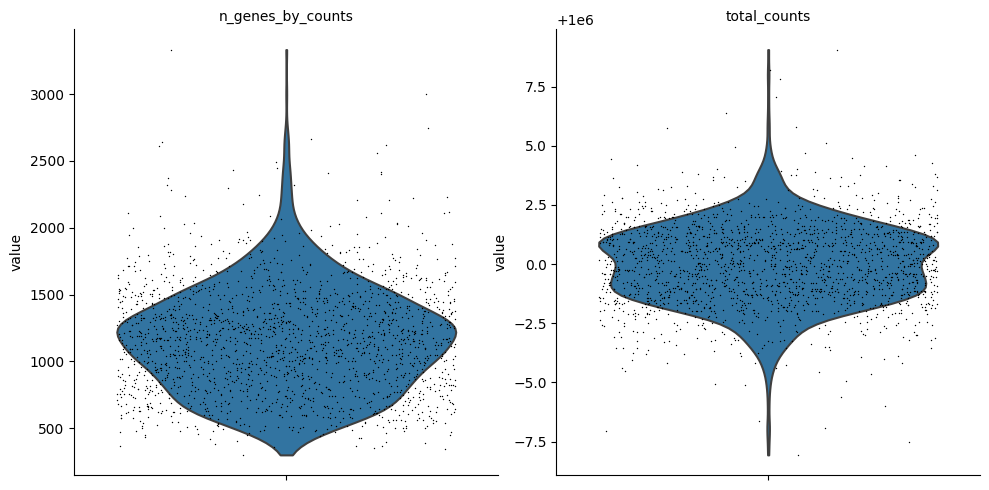

In [80]:
scanpy.pl.violin(amtx, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [81]:
amtx.obs

,n_genes_by_counts,total_counts
ORNnuclei_adult_nSybUNC84GFP_P1_A10,1029,1.000004e+06
ORNnuclei_adult_nSybUNC84GFP_P1_A13,1044,9.999996e+05
ORNnuclei_adult_nSybUNC84GFP_P1_A15,1086,9.999971e+05
ORNnuclei_adult_nSybUNC84GFP_P1_A16,2282,1.000003e+06
ORNnuclei_adult_nSybUNC84GFP_P1_A17,1133,1.000003e+06
...,...,...
ORN_10day_nuclei_P3_O9,394,9.999999e+05
ORN_10day_nuclei_P3_P12,482,1.000000e+06
ORN_10day_nuclei_P3_P6,950,9.999987e+05
ORN_10day_nuclei_P3_P8,353,9.999996e+05


In [82]:
scanpy.pp.log1p(amtx)

In [83]:
scanpy.pp.highly_variable_genes(amtx, min_mean=0.0125, max_mean=10, min_disp=0.5)

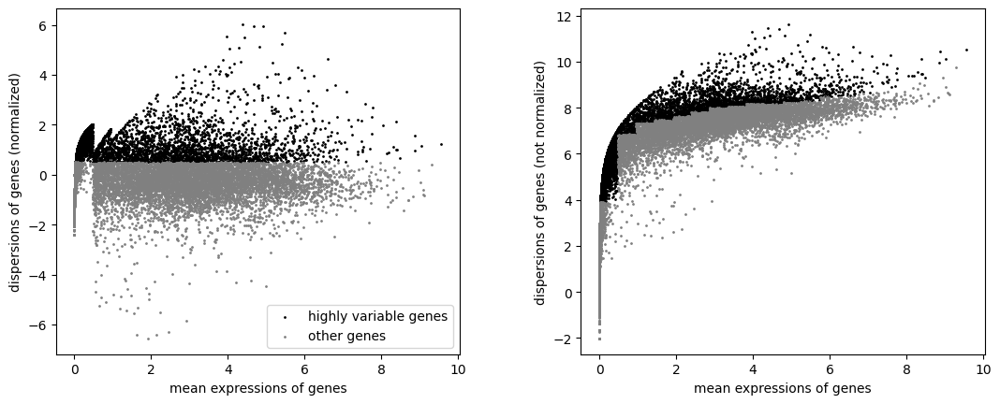

In [84]:
scanpy.pl.highly_variable_genes(amtx)

In [85]:
amtx.var[(amtx.var.index.isin(npall))]

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
Dsk,2,0.283058,99.894236,535.262695,True,0.249246,5.920722,1.485348
Eh,1,0.001862,99.947118,3.521251,False,0.001860,1.258816,-0.793658
FMRFa,5,0.008692,99.735590,16.437294,False,0.008655,1.797579,-0.530280
SP,1,0.006359,99.947118,12.024777,False,0.006339,2.486969,-0.193267
rk,37,5.489583,98.043363,10380.802734,True,1.870199,7.961842,1.163716
...,...,...,...,...,...,...,...,...
MsR2,31,0.804721,98.360656,1521.728271,True,0.590406,6.892958,0.545809
Hr4,257,20.058674,86.409307,37930.953125,True,3.047313,8.139076,0.719078
Pburs,1,0.186560,99.947118,352.784485,True,0.171058,5.865858,1.458527
AstA-R1,715,65.043488,62.189318,122997.234375,True,4.190314,8.608963,1.197217


In [86]:
amtx.var[(amtx.var.index.isin(npall))]["highly_variable"].value_counts()

highly_variable
False    53
True     36
Name: count, dtype: int64

<Axes: >

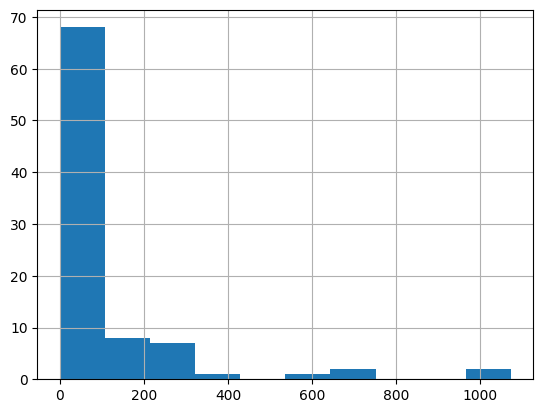

In [87]:
amtx.var[(amtx.var.index.isin(npall))]["n_cells_by_counts"].hist()

In [88]:
amtx.var[(amtx.var.index.isin(neuropeptides))]

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
Dsk,2,0.283058,99.894236,5.352627e+02,True,2.492463e-01,5.920722,1.485348
Eh,1,0.001862,99.947118,3.521251e+00,False,1.860379e-03,1.258816,-0.793658
FMRFa,5,0.008692,99.735590,1.643729e+01,False,8.654821e-03,1.797579,-0.530280
SP,1,0.006359,99.947118,1.202478e+01,False,6.338819e-03,2.486969,-0.193267
Akh,0,0.000000,100.000000,0.000000e+00,False,1.000000e-12,NaN,0.000000
Ms,54,2.088938,97.144368,3.950183e+03,False,1.127827e+00,5.491972,-1.728542
Dh44,25,0.408325,98.677948,7.721426e+02,True,3.424010e-01,6.153711,1.599247
Ptth,2,0.013801,99.894236,2.609676e+01,False,1.370615e-02,3.156819,0.134194
Crz,0,0.000000,100.000000,0.000000e+00,False,1.000000e-12,NaN,0.000000
AstA,4,0.019797,99.788472,3.743559e+01,False,1.960331e-02,2.939728,0.028068


<Axes: >

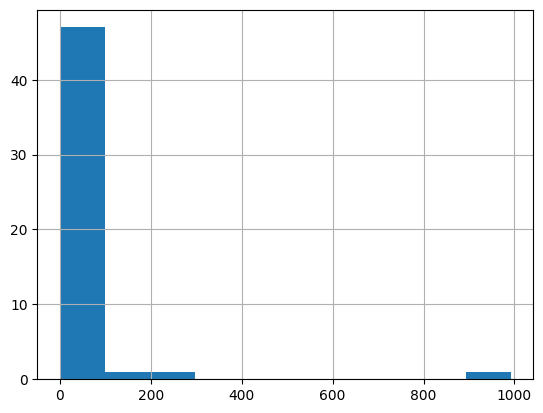

In [89]:
amtx.var[(amtx.var.index.isin(neuropeptides))]["n_cells_by_counts"].hist()

<Axes: >

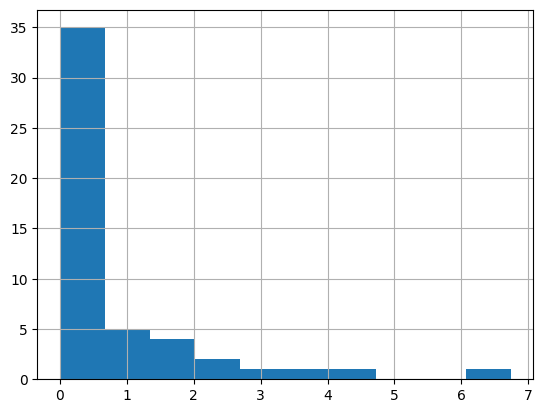

In [90]:
amtx.var[(amtx.var.index.isin(neuropeptides))]["means"].hist()

In [92]:
amtx.var[(amtx.var.index.isin(neuropeptides))]["highly_variable"].value_counts()

highly_variable
False    34
True     16
Name: count, dtype: int64

In [93]:
amtx.var[(amtx.var.index.isin(neuropeptide_receptors))]

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
rk,37,5.489583,98.043363,10380.802734,True,1.870199,7.961842,1.163716
TkR99D,23,0.120911,98.783712,228.643265,False,0.114142,3.433717,0.269558
TkR86C,195,71.466431,89.687996,135143.015625,True,4.283123,8.240126,0.607678
RYa-R,695,2.737296,63.246959,5176.226074,False,1.318362,4.624444,-2.779994
Lgr1,193,66.813858,89.793760,126345.000000,False,4.216766,7.963592,0.165674
AkhR,8,0.046361,99.576943,87.668533,False,0.045318,3.393601,0.249947
Proc-R,38,2.135651,97.990481,4038.516602,True,1.142837,7.773510,1.036702
SPR,212,48.616642,88.789001,91934.070312,True,3.904326,8.867727,1.610816
CCKLR-17D3,33,10.034477,98.254892,18975.197266,True,2.401025,7.873768,0.606524
CCHa2-R,18,0.068497,99.048123,129.526947,False,0.066253,3.433535,0.269469


<Axes: >

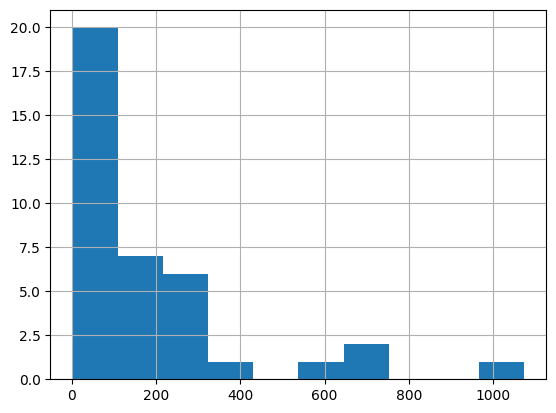

In [95]:
amtx.var[(amtx.var.index.isin(neuropeptide_receptors))]["n_cells_by_counts"].hist()

<Axes: >

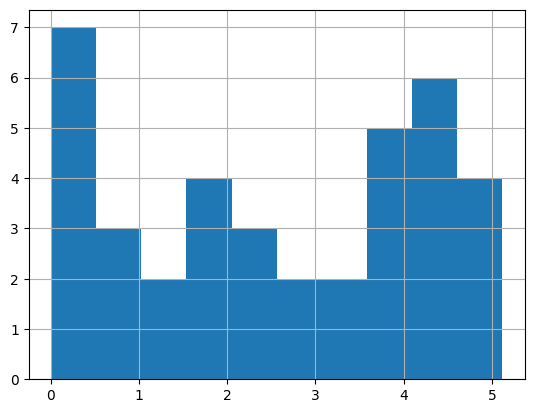

In [96]:
amtx.var[(amtx.var.index.isin(neuropeptide_receptors))]["means"].hist()

In [97]:
amtx.var[(amtx.var.index.isin(spab))]

,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
CG2816,1,0.002533,99.947118,4.78902,False,0.002529,1.566326,-0.64333


In [98]:
highly_variable_list = amtx.var.highly_variable.reset_index()# %%
the_genes = highly_variable_list[highly_variable_list["highly_variable"]]["index"]

In [99]:
highly_variable_list

,index,highly_variable
0,7SLRNA:CR32864,False
1,a,True
2,abd-A,False
3,Abd-B,False
4,Abl,False
...,...,...
17467,Tlk,False
17468,muc,False
17469,THG,False
17470,Rap2l,False


In [100]:
pd.set_option('display.max_rows', 500)

In [101]:
amtx.var.highly_variable

7SLRNA:CR32864    False
a                  True
abd-A             False
Abd-B             False
Abl               False
                  ...  
Tlk               False
muc               False
THG               False
Rap2l             False
mCD8-GFP          False
Name: highly_variable, Length: 17472, dtype: bool

In [103]:
amtx

AnnData object with n_obs × n_vars = 1891 × 17472
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [108]:
amtx[:, amtx.var.highly_variable]

View of AnnData object with n_obs × n_vars = 1891 × 4039
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [109]:
amtx[:, (amtx.var.index.isin(npall)) | (amtx.var.highly_variable)]

View of AnnData object with n_obs × n_vars = 1891 × 4092
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [110]:
amtx = amtx[:, (amtx.var.index.isin(npall)) | (amtx.var.highly_variable)]

In [111]:
scanpy.pp.regress_out(amtx, ['total_counts'])

In [112]:
amtx

AnnData object with n_obs × n_vars = 1891 × 4092
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [113]:
amtx.to_df()

,a,nAChRalpha1,mAChR-A,Act42A,Act57B,Act79B,Act87E,Act88F,ade2,Adf1,...,CR46265,CR46267,dmt,acal,CR46271,CG46281,br,wupA,InR,elgi
ORNnuclei_adult_nSybUNC84GFP_P1_A10,-0.109240,0.553883,-0.483093,-0.132718,-0.000264,-0.023752,-0.038438,-0.016684,-0.102005,-0.379153,...,-0.019334,0.003737,-0.140798,-0.010450,-0.014954,-0.003440,-0.158686,-0.025556,-0.811374,-0.126821
ORNnuclei_adult_nSybUNC84GFP_P1_A13,-0.131763,-0.092699,-0.499837,-0.268589,-0.014724,-0.010585,-0.028056,-0.005745,-0.063394,-0.363167,...,-0.012755,-0.005682,-0.156748,-0.005911,-0.006941,-0.011913,-0.180814,-0.012262,-1.479870,-0.181336
ORNnuclei_adult_nSybUNC84GFP_P1_A15,-0.146063,-0.088328,-0.510468,-0.354857,-0.023905,-0.002225,-0.021464,0.001201,-0.038879,-0.353017,...,-0.008578,-0.011662,-0.166875,-0.003029,-0.001854,-0.017293,-0.194863,-0.003821,6.636651,-0.215948
ORNnuclei_adult_nSybUNC84GFP_P1_A16,-0.110313,0.346486,-0.483890,-0.139188,-0.000953,-0.023125,-0.037943,-0.016164,-0.100166,-0.378392,...,-0.019021,0.003289,-0.141558,-0.010234,-0.014572,-0.003844,-0.159739,-0.024923,-1.019815,3.367511
ORNnuclei_adult_nSybUNC84GFP_P1_A17,-0.111028,-0.099037,-0.484422,1.008443,1.671691,-0.022707,-0.037614,1.136128,-0.098941,-0.377884,...,-0.018812,0.002990,-0.142064,-0.010090,-0.014318,-0.004113,-0.160442,-0.024501,-1.466033,-0.131148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ORN_10day_nuclei_P3_O9,-0.130333,-0.093136,-0.498774,-0.259963,-0.013806,-0.011421,-0.028715,-0.006439,-0.065845,-0.364182,...,-0.013173,-0.005084,-0.155735,-0.006199,-0.007450,-0.011375,-0.179409,-0.013106,5.055492,-0.177875
ORN_10day_nuclei_P3_P12,-0.128188,-0.093792,-0.497179,-0.247023,-0.012429,-0.012675,-0.029704,-0.007481,-0.069523,-0.365704,...,-0.013799,-0.004187,-0.154216,-0.006631,-0.008213,-0.010568,-0.177301,-0.014372,-1.477484,-0.172683
ORN_10day_nuclei_P3_P6,-0.137125,-0.091060,-0.503824,-0.300940,-0.018167,-0.007450,-0.025584,-0.003140,-0.054201,-0.359361,...,-0.011189,-0.007925,-0.160546,-0.004830,-0.005033,-0.013930,-0.186082,-0.009097,3.229327,-0.194316
ORN_10day_nuclei_P3_P8,-0.132120,-0.092590,8.820806,-0.270746,-0.014954,-0.010376,-0.027891,-0.005571,-0.062781,-0.362913,...,-0.012651,-0.005831,-0.157001,-0.005839,-0.006814,-0.012048,-0.181165,-0.012051,-1.480109,-0.182201


In [114]:
scanpy.pp.scale(amtx, max_value=10)

In [115]:
amtx.to_df()

,a,nAChRalpha1,mAChR-A,Act42A,Act57B,Act79B,Act87E,Act88F,ade2,Adf1,...,CR46265,CR46267,dmt,acal,CR46271,CG46281,br,wupA,InR,elgi
ORNnuclei_adult_nSybUNC84GFP_P1_A10,-0.142969,1.005289,-0.324188,-0.114618,-0.001577,-0.120493,-0.134436,-0.126899,-0.171933,-0.263216,...,-0.078562,0.029833,-0.192610,-0.060146,-0.090760,-0.012650,-0.163443,-0.118905,-0.324604,-0.123368
ORNnuclei_adult_nSybUNC84GFP_P1_A13,-0.172445,-0.168247,-0.335425,-0.231959,-0.087900,-0.053698,-0.098125,-0.043692,-0.106853,-0.252118,...,-0.051830,-0.045357,-0.214430,-0.034020,-0.042129,-0.043802,-0.186234,-0.057052,-0.592047,-0.176398
ORNnuclei_adult_nSybUNC84GFP_P1_A15,-0.191160,-0.160314,-0.342559,-0.306462,-0.142708,-0.011289,-0.075071,0.009138,-0.065532,-0.245072,...,-0.034857,-0.093097,-0.228283,-0.017432,-0.011252,-0.063582,-0.200705,-0.017780,2.655102,-0.210068
ORNnuclei_adult_nSybUNC84GFP_P1_A16,-0.144372,0.628866,-0.324723,-0.120206,-0.005687,-0.117312,-0.132707,-0.122937,-0.168834,-0.262688,...,-0.077289,0.026253,-0.193649,-0.058902,-0.088445,-0.014133,-0.164528,-0.115960,-0.407994,3.275806
ORNnuclei_adult_nSybUNC84GFP_P1_A17,-0.145308,-0.179750,-0.325080,0.870911,9.979521,-0.115192,-0.131554,8.641185,-0.166768,-0.262335,...,-0.076441,0.023866,-0.194342,-0.058072,-0.086901,-0.015122,-0.165252,-0.113996,-0.586511,-0.127576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ORN_10day_nuclei_P3_O9,-0.170574,-0.169041,-0.334711,-0.224509,-0.082419,-0.057939,-0.100430,-0.048975,-0.110985,-0.252823,...,-0.053527,-0.040583,-0.213044,-0.035679,-0.045216,-0.041824,-0.184787,-0.060979,2.022534,-0.173031
ORN_10day_nuclei_P3_P12,-0.167766,-0.170231,-0.333641,-0.213334,-0.074198,-0.064300,-0.103889,-0.056899,-0.117183,-0.253880,...,-0.056073,-0.033422,-0.210966,-0.038167,-0.049848,-0.038857,-0.182617,-0.066870,-0.591092,-0.167980
ORN_10day_nuclei_P3_P6,-0.179463,-0.165272,-0.338100,-0.259898,-0.108453,-0.037794,-0.089480,-0.023881,-0.091358,-0.249476,...,-0.045465,-0.063259,-0.219625,-0.027799,-0.030550,-0.051219,-0.191661,-0.042325,1.291946,-0.189024
ORN_10day_nuclei_P3_P8,-0.172913,-0.168049,5.919363,-0.233822,-0.089270,-0.052638,-0.097549,-0.042371,-0.105820,-0.251942,...,-0.051406,-0.046550,-0.214776,-0.033605,-0.041357,-0.044297,-0.186596,-0.056070,-0.592142,-0.177239


In [116]:
scanpy.tl.pca(amtx, svd_solver='arpack')

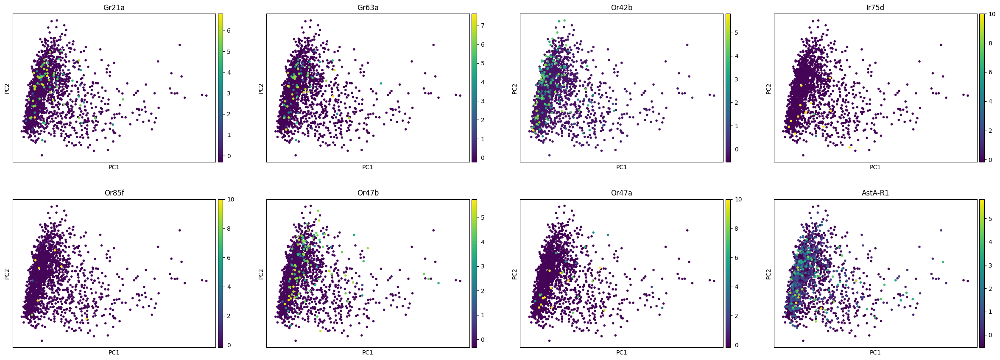

In [117]:
scanpy.pl.pca(amtx, color=['Gr21a', 'Gr63a', 'Or42b', 'Ir75d',
                                  'Or85f', 'Or47b', 'Or47a', 'AstA-R1'])

In [118]:
scanpy.pp.neighbors(amtx, n_neighbors=10, n_pcs=40)

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [119]:
scanpy.tl.umap(amtx)

In [120]:
amtx

AnnData object with n_obs × n_vars = 1891 × 4092
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

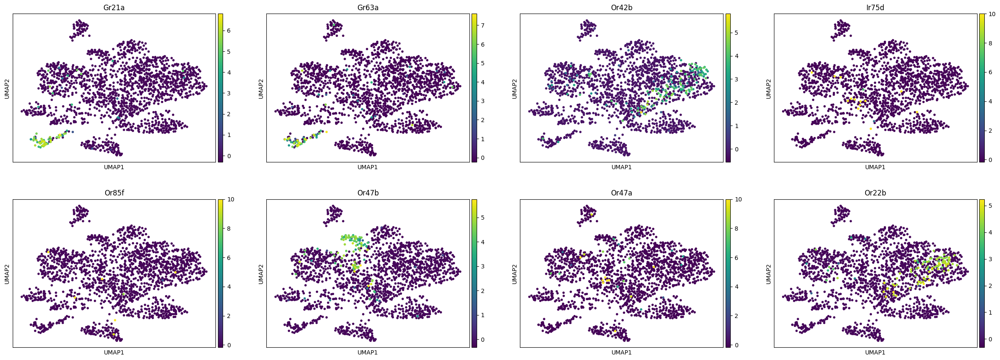

In [121]:
scanpy.pl.umap(amtx, color=['Gr21a', 'Gr63a', 'Or42b', 'Ir75d',
                                  'Or85f', 'Or47b', 'Or47a', 'Or22b'] )

In [127]:
neuropeptides[:-1]

['Akh',
 'AstA',
 'AstC',
 'AstCC',
 'Burs',
 'CCAP',
 'CCHa1',
 'CCHa2',
 'CNMa',
 'Capa',
 'Crz',
 'Dh31',
 'Dh44',
 'Dsk',
 'ETH',
 'Eh',
 'FMRFa',
 'Gpa2',
 'Gpb5',
 'Hug',
 'ITP',
 'Ilp1',
 'Ilp2',
 'Ilp3',
 'Ilp4',
 'Ilp5',
 'Ilp6',
 'Ilp7',
 'Ilp8',
 'Lk',
 'Lst',
 'Mip',
 'Ms',
 'NPF',
 'Nplp1',
 'Nplp2',
 'Nplp3',
 'Nplp4',
 'Orcokinin',
 'Pburs',
 'Pdf',
 'Proc',
 'Ptth',
 'RYa',
 'SIFa',
 'SP',
 'Tk',
 'Trissin',
 'amn',
 'sNPF']

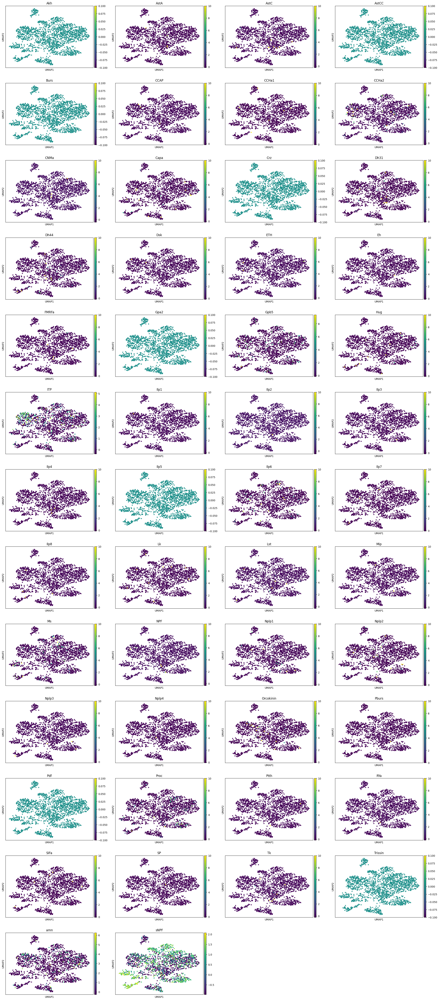

In [128]:
scanpy.pl.umap(amtx, color=neuropeptides[:-1])

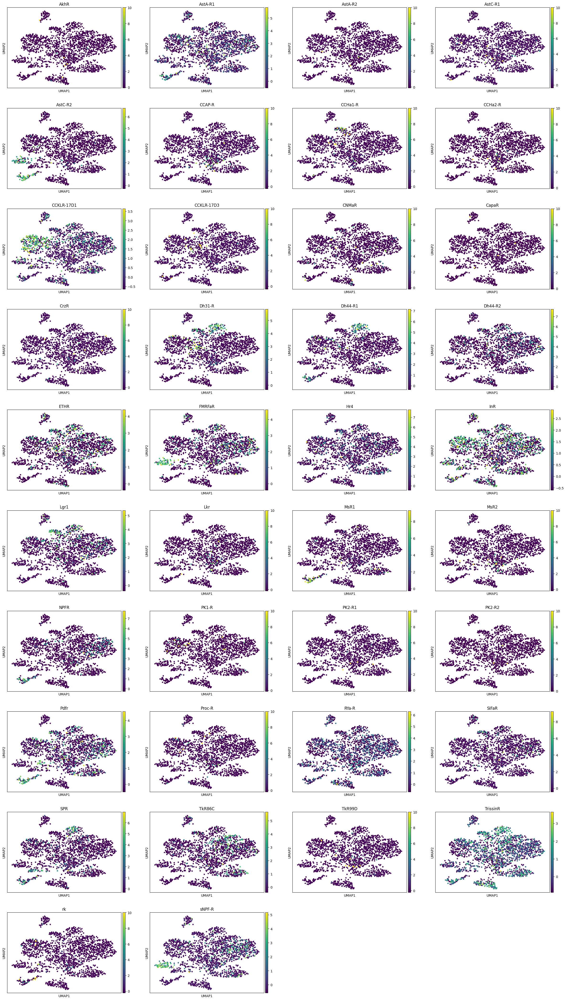

In [129]:
scanpy.pl.umap(amtx, color=neuropeptide_receptors)

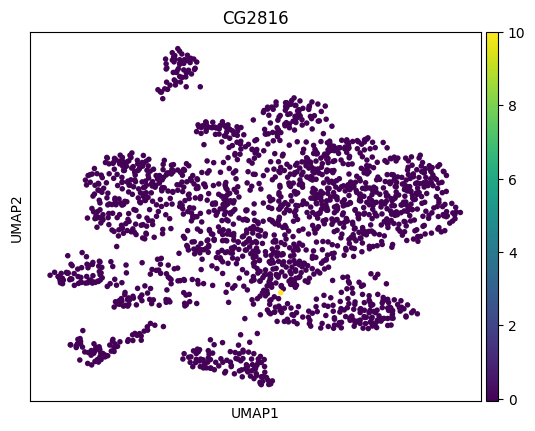

In [130]:
scanpy.pl.umap(amtx, color=spab)

In [131]:
scanpy.tl.leiden(amtx, key_added='clusters')

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


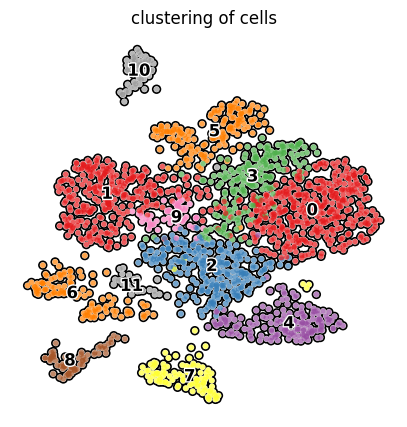

In [132]:
from matplotlib.pyplot import rc_context
with rc_context({'figure.figsize': (5, 5)}):
    scanpy.pl.umap(amtx, color='clusters', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

In [144]:
#have to take out cause they are not highly variable? 'Ir75b', 'Or19a', 'Or19b', 'Or67d'
marker_genes = ['Gr21a', 'Gr63a', 'Or69a',
               'Or13a', 'Ir75a', 'Ir75c', 'Or65a', 'Or65b', 'Or65c',
               'Or7a', 'Ir64a', 'Or42b', 'Or22a', 'Or22b', 'Or59b', 'Or88a',
               'Or47b', 'Or92a', 'Ir75d', 'Ir92a', 'Or9a', 'Or49b', 'Ir21a', 'Ir40a', 'Gr28b']

## Cluster 8 - V, Gr21a, Gr63a expression
## Cluster 9 - DL3, Or65abc
## Cluster 10 - DC2, Or13a
## Cluster 4 - looks like DL2d/v_DPL1_VC3l* and DP1m_DC4, Ir75a, Ir75c, Ir64a
## Cluster 11 - looks like VPL1_VP3 and VP4_VP1d_VP2, Ir21a, Ir40a, Gr28b
## Cluster 3 - looks like D, Or69a

## Cluster 5 - looks like VA1v, Or47b


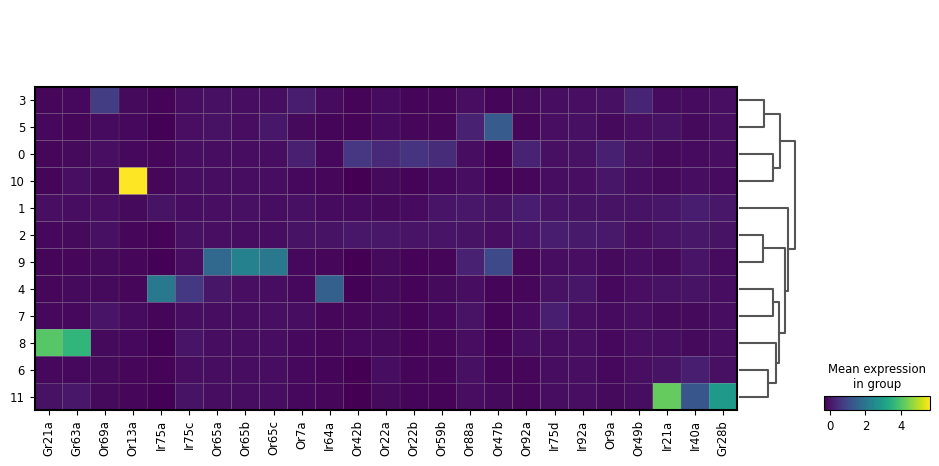

In [145]:
scanpy.pl.matrixplot(amtx, marker_genes, groupby='clusters', dendrogram=True)

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


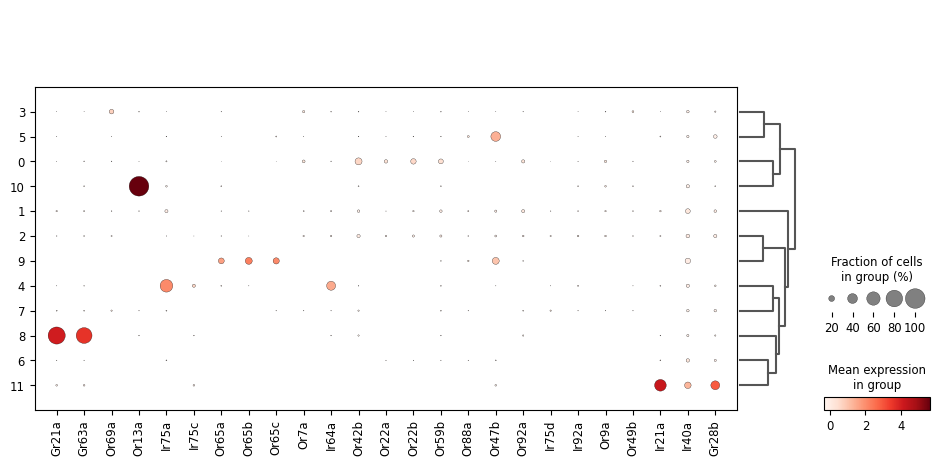

In [146]:
scanpy.pl.dotplot(amtx, marker_genes, dendrogram=True, groupby='clusters')

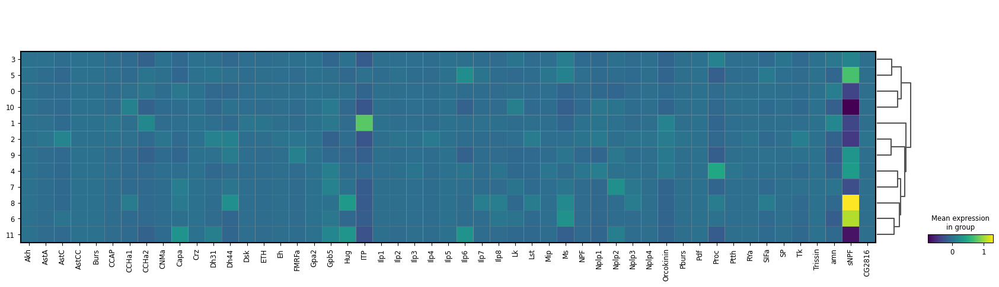

In [147]:
scanpy.pl.matrixplot(amtx, neuropeptides[:-1]+spab, groupby='clusters', dendrogram=True)

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


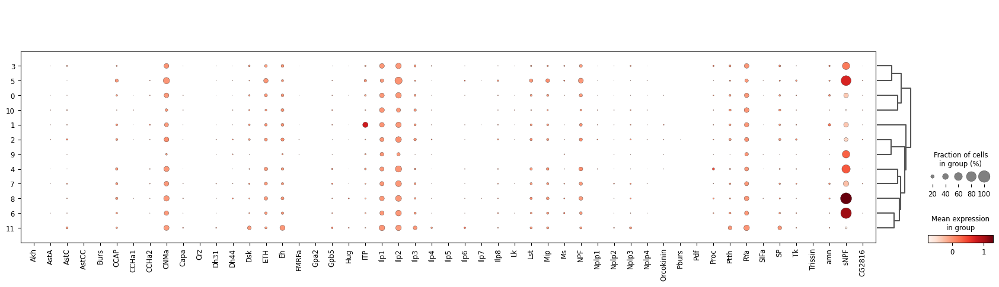

In [148]:
scanpy.pl.dotplot(amtx, neuropeptides[:-1]+spab, groupby='clusters', dendrogram=True)

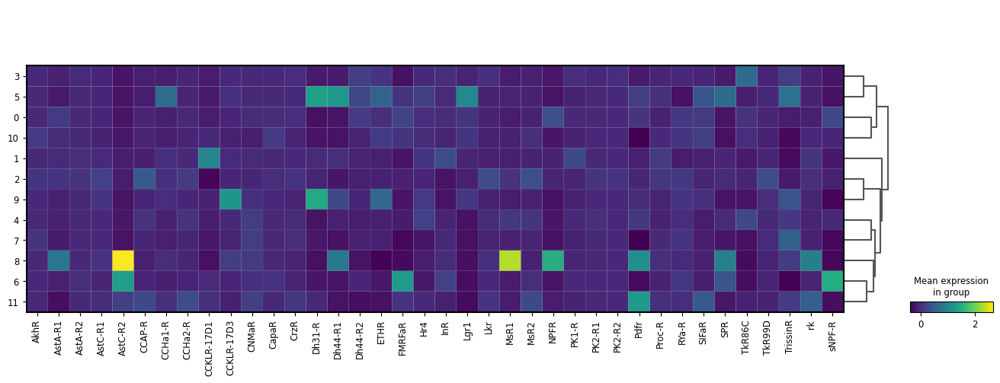

In [149]:
scanpy.pl.matrixplot(amtx, neuropeptide_receptors, groupby='clusters', dendrogram=True)

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


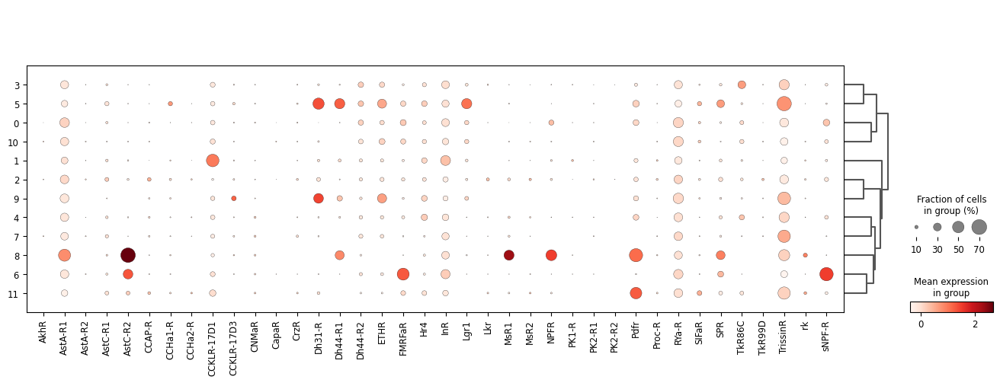

In [150]:
scanpy.pl.dotplot(amtx, neuropeptide_receptors, groupby='clusters', dendrogram=True)

/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/yazatian/Desktop/rnaseq/sca/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_

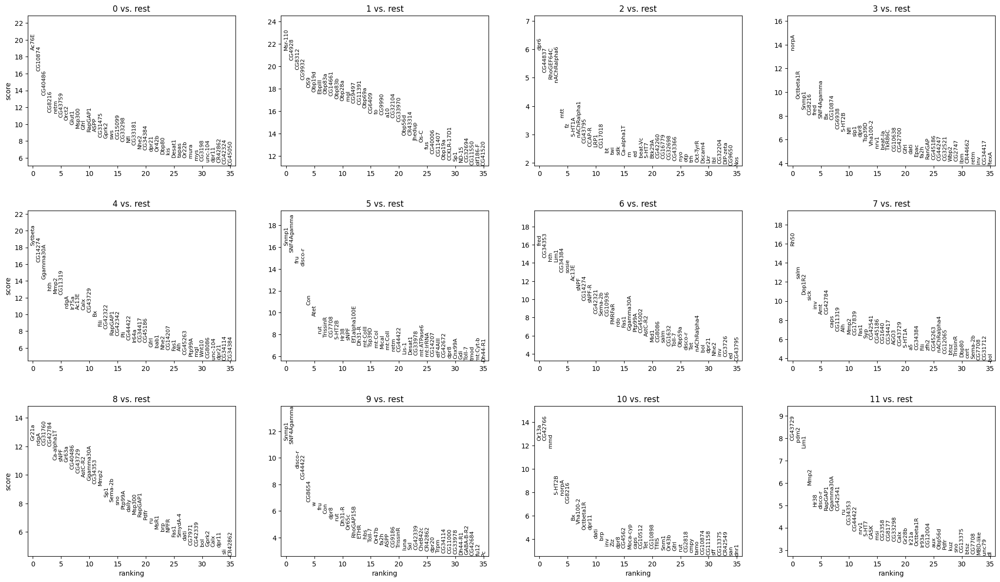

In [151]:
scanpy.tl.rank_genes_groups(amtx, 'clusters', method='wilcoxon')
scanpy.pl.rank_genes_groups(amtx, n_genes=36, sharey=False)

In [143]:
gene_names[gene_names.str.contains('Ir75')]

7637     Ir75a
7697     Ir75d
13694    Ir75c
13695    Ir75b
dtype: object

In [43]:
len(neuropeptides)

51

In [44]:
len(neuropeptide_receptors)

38